## This notebooks takes Sei, Enformer, and Akita results for PCGC DNVs (from Richter 2020), produces some figures and finds the variants that are significant in all three models.

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn3


import pandas as pd
import os
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import shutil
import tensorflow_hub as hub
import joblib
import gzip
import kipoiseq
from kipoiseq import Interval
import pyfaidx
import pandas as pd
import numpy as np
import argparse
import sys
from scipy.stats import zscore
from datetime import date, datetime

import pickle

import git
#get top level directory of the git repository:
git_repo = git.Repo(os.getcwd(), search_parent_directories=True)
git_root = git_repo.git.rev_parse("--show-toplevel") #this is path/to/PCGC_Challenge


/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/requests/__init__.py:104: RequestsDependencyWarning: urllib3 (1.26.7) or chardet (5.0.0)/charset_normalizer (2.0.7) doesn't match a supported version!
  RequestsDependencyWarning)


# Initialize Enformer, Akita, and code to visualize their predictions for interesting variants

In [2]:
model_path = 'https://tfhub.dev/deepmind/enformer/1' #path to Enformer. 
fasta_file = f'{git_root}/models/hg38_genome.fa'# 
#@title `Enformer`, `EnformerScoreVariantsNormalized`, `EnformerScoreVariantsPCANormalized`,
SEQUENCE_LENGTH = 393216

class Enformer:

  def __init__(self, tfhub_url):
    self._model = hub.load(tfhub_url).model

  def predict_on_batch(self, inputs):
    predictions = self._model.predict_on_batch(inputs)
    return {k: v.numpy() for k, v in predictions.items()}

  @tf.function
  def contribution_input_grad(self, input_sequence,
                              target_mask, output_head='human'):
    input_sequence = input_sequence[tf.newaxis]

    target_mask_mass = tf.reduce_sum(target_mask)
    with tf.GradientTape() as tape:
      tape.watch(input_sequence)
      prediction = tf.reduce_sum(
          target_mask[tf.newaxis] *
          self._model.predict_on_batch(input_sequence)[output_head]) / target_mask_mass

    input_grad = tape.gradient(prediction, input_sequence) * input_sequence
    input_grad = tf.squeeze(input_grad, axis=0)
    return tf.reduce_sum(input_grad, axis=-1)


class EnformerScoreVariantsRaw:

  def __init__(self, tfhub_url, organism='human'):
    self._model = Enformer(tfhub_url)
    self._organism = organism
  
  def predict_on_batch(self, inputs):
    ref_prediction = self._model.predict_on_batch(inputs['ref'])[self._organism]
    alt_prediction = self._model.predict_on_batch(inputs['alt'])[self._organism]

    return alt_prediction.mean(axis=1) - ref_prediction.mean(axis=1)


class EnformerScoreVariantsNormalized:

  def __init__(self, tfhub_url, transform_model,
               organism='human'):
    assert organism == 'human', 'Transforms only compatible with organism=human'
    self._model = EnformerScoreVariantsRaw(tfhub_url, organism)
    
    self._transform = transform_model.steps[0][1]  # StandardScaler.
    
  def predict_on_batch(self, inputs):
    scores = self._model.predict_on_batch(inputs)
    return self._transform.transform(scores)


class EnformerScoreVariantsPCANormalized:

  def __init__(self, tfhub_url, transform_model,
               organism='human', num_top_features=500):
    self._model = EnformerScoreVariantsRaw(tfhub_url, organism)
    self.transform_model = transform_model
    self._num_top_features = num_top_features
    
  def predict_on_batch(self, inputs):
    scores = self._model.predict_on_batch(inputs)
    return self.transform_model.transform(scores)[:, :self._num_top_features]


# TODO(avsec): Add feature description: Either PCX, or full names.



# @title `variant_centered_sequences`

class FastaStringExtractor:
    
    def __init__(self, fasta_file):
        self.fasta = pyfaidx.Fasta(fasta_file)
        self._chromosome_sizes = {k: len(v) for k, v in self.fasta.items()}

    def extract(self, interval: Interval, **kwargs) -> str:
        # Truncate interval if it extends beyond the chromosome lengths.
        chromosome_length = self._chromosome_sizes[interval.chrom]
        trimmed_interval = Interval(interval.chrom,
                                    max(interval.start, 0),
                                    min(interval.end, chromosome_length),
                                    )
        # pyfaidx wants a 1-based interval
        sequence = str(self.fasta.get_seq(trimmed_interval.chrom,
                                          trimmed_interval.start + 1,
                                          trimmed_interval.stop).seq).upper()
        # Fill truncated values with N's.
        pad_upstream = 'N' * max(-interval.start, 0)
        pad_downstream = 'N' * max(interval.end - chromosome_length, 0)
        return pad_upstream + sequence + pad_downstream

    def close(self):
        return self.fasta.close()


def variant_generator(vcf_file, gzipped=False):
  """Yields a kipoiseq.dataclasses.Variant for each row in VCF file."""
  def _open(file):
    return gzip.open(vcf_file, 'rt') if gzipped else open(vcf_file)
    
  with _open(vcf_file) as f:
    for line in f:
      if line.startswith('#') or line.startswith('CHROM'):
        continue
      chrom, pos, id, ref, alt_list = line.split('\t')[:5]
      # Split ALT alleles and return individual variants as output.
      for alt in alt_list.split(','):
        yield kipoiseq.dataclasses.Variant(chrom=chrom, pos=pos,
                                           ref=ref, alt=alt, id=id)


def one_hot_encode(sequence):
  return kipoiseq.transforms.functional.one_hot_dna(sequence).astype(np.float32)


def variant_centered_sequences(vcf_file, sequence_length, gzipped=False,
                               chr_prefix=''):
  seq_extractor = kipoiseq.extractors.VariantSeqExtractor(
    reference_sequence=FastaStringExtractor(fasta_file))

  for variant in variant_generator(vcf_file, gzipped=gzipped):
    interval = Interval(chr_prefix + variant.chrom,
                        variant.pos, variant.pos)
    interval = interval.resize(sequence_length)
    center = interval.center() - interval.start

    reference = seq_extractor.extract(interval, [], anchor=center)
    alternate = seq_extractor.extract(interval, [variant], anchor=center)

    yield {'inputs': {'ref': one_hot_encode(reference),
                      'alt': one_hot_encode(alternate)},
           'metadata': {'chrom': chr_prefix + variant.chrom,
                        'pos': variant.pos,
                        'id': variant.id,
                        'ref': variant.ref,
                        'alt': variant.alt}}
    
    
    
# @title `plot_tracks`

def plot_tracks(tracks, interval, height=1.5,filename = None):
    fig, axes = plt.subplots(len(tracks)+1, 1, figsize=(20, height * len(tracks)),sharex=True)
    for idx, (ax, (title, y)) in enumerate(zip(axes, tracks.items())):
        ax.fill_between(np.linspace(interval.start, interval.end, num=len(y)), y)
        ax.set_title(title)
        sns.despine(top=True, right=True, bottom=True)
    if idx == len(tracks):
        ax.bar(np.linspace(interval.start, interval.end, num=len(y)), y)

    ax.set_xlabel(str(interval))
    plt.tight_layout()
    if filename != None:
        plt.savefig(f"{filename}.png")
    plt.show()


model = Enformer(model_path)

fasta_extractor = FastaStringExtractor(fasta_file)


In [40]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import SubplotSpec
from collections import defaultdict
from pybedtools import BedTool
import sys




#Load Akita Functions

import os
import json
import subprocess
import shutil
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' ### run on CPU

import tensorflow as tf
print(tf.__version__)
if tf.__version__[0] == '1':
    tf.compat.v1.enable_eager_execution()

import numpy as np
import pandas as pd
import pysam
import matplotlib.pyplot as plt
from cooltools.lib.numutils import set_diag
import sys
sys.path.append("/pollard/data/projects/sdrusinsky/pollard_lab/basenji")
from basenji import dataset, dna_io, seqnn

import cooler
import cooltools
from cooltools.lib.numutils import observed_over_expected
from cooltools.lib.numutils import adaptive_coarsegrain
from cooltools.lib.numutils import interpolate_bad_singletons
from cooltools.lib.numutils import interp_nan, set_diag
from cooltools.lib.plotting import *


import kipoiseq
from kipoiseq import Interval
import pyfaidx
from collections import Counter


### load params, specify model ###
model_dir = f'{git_root}/models/Akita/basenji/manuscripts/akita/'
params_file = model_dir+'params.json'
model_file  = model_dir+'model_best.h5'
with open(params_file) as params_open:
    params = json.load(params_open)
    params_model = params['model']
    params_train = params['train']

seqnn_model = seqnn.SeqNN(params_model)


### restore model ###
# note: run %%bash get_model.sh 
# if you have not already downloaded the model
seqnn_model.restore(model_file)
print('successfully loaded')


### names of targets ###
data_dir = os.path.join(model_dir,"data")

hic_targets = pd.read_csv(data_dir+'/targets.txt',sep='\t')
hic_file_dict_num = dict(zip(hic_targets['index'].values, hic_targets['file'].values) )
hic_file_dict     = dict(zip(hic_targets['identifier'].values, hic_targets['file'].values) )
hic_num_to_name_dict = dict(zip(hic_targets['index'].values, hic_targets['identifier'].values) )

# read data parameters
data_stats_file = '%s/statistics.json' % data_dir
with open(data_stats_file) as data_stats_open:
    data_stats = json.load(data_stats_open)
seq_length = data_stats['seq_length']
target_length = data_stats['target_length']
hic_diags =  data_stats['diagonal_offset']
target_crop = data_stats['crop_bp'] // data_stats['pool_width']
target_length1 = data_stats['seq_length'] // data_stats['pool_width']

### for converting from flattened upper-triangluar vector to symmetric matrix  ###
def from_upper_triu(vector_repr, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vector_repr
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
    return z + z.T



#for parsing the reference genome, in order to find the DNA nucleotides that flank each variant
#these flanking nucleotides will be used to form a sequence of the expected length for input into Akita, with the variant at the center
class FastaStringExtractor:
    
    def __init__(self, fasta_file):
        self.fasta = pyfaidx.Fasta(fasta_file)
        self._chromosome_sizes = {k: len(v) for k, v in self.fasta.items()}

    def extract(self, interval: Interval, **kwargs) -> str:
        # Truncate interval if it extends beyond the chromosome lengths.
        chromosome_length = self._chromosome_sizes[interval.chrom]
        trimmed_interval = Interval(interval.chrom,
                                    max(interval.start, 0),
                                    min(interval.end, chromosome_length),
                                    )
        # pyfaidx wants a 1-based interval
        sequence = str(self.fasta.get_seq(trimmed_interval.chrom,
                                          trimmed_interval.start + 1,
                                          trimmed_interval.stop).seq).upper()
        # Fill truncated values with N's.
        pad_upstream = 'N' * max(-interval.start, 0)
        pad_downstream = 'N' * max(interval.end - chromosome_length, 0)
        return pad_upstream + sequence + pad_downstream

    def close(self):
        return self.fasta.close()

#for parsing VCF file, and then scoring each variant one by one
def variant_generator(vcf_file, gzipped=False):
  """Yields a kipoiseq.dataclasses.Variant for each row in VCF file."""
  def _open(file):
    return gzip.open(vcf_file, 'rt') if gzipped else open(vcf_file)
    
  with _open(vcf_file) as f:
    for line in f:
      if line.startswith('#') or line.startswith('CHROM'):
        continue
      chrom, pos, id, ref, alt_list = line.split('\t')[:5]
      # Split ALT alleles and return individual variants as output.
      for alt in alt_list.split(','):
        yield kipoiseq.dataclasses.Variant(chrom=chrom, pos=pos,
                                           ref=ref, alt=alt, id=id)


def one_hot_encode(sequence):
  return kipoiseq.transforms.functional.one_hot_dna(sequence).astype(np.float32)


def get_N_composition(seq: str):
    """
    Get % of N's in input sequence
    
    Input: 
        seq: string of sequence
    Returns: % of Ns in input sequence
    """
    count = Counter(seq)
    
    for key, value in count.items():
        count[key] = round(value/len(seq)*100,2)
#     if 'N' in count.keys():
    if count['N'] > 0:
        return count['N']
    else:
        return 0 

def variant_centered_sequences(vcf_file, sequence_length, gzipped=False,
                               chr_prefix=''):
  seq_extractor = kipoiseq.extractors.VariantSeqExtractor(
    reference_sequence=FastaStringExtractor(fasta_file))

  for variant in variant_generator(vcf_file, gzipped=gzipped):
    interval = Interval(chr_prefix + variant.chrom,
                        variant.pos, variant.pos)
    interval = interval.resize(sequence_length)
    center = interval.center() - interval.start

    reference = seq_extractor.extract(interval, [], anchor=center)
    ref_N_composition = get_N_composition(reference)
    
    alternate = seq_extractor.extract(interval, [variant], anchor=center)
    alt_N_composition = get_N_composition(alternate)
    yield {'inputs': {'ref': dna_io.dna_1hot(reference),
                      'alt': dna_io.dna_1hot(alternate)},
           'metadata': {'chrom': chr_prefix + variant.chrom,
                        'pos': variant.pos,
                        'id': variant.id,
                        'ref': variant.ref,
                        'alt': variant.alt,
                        'ref_N_composition':ref_N_composition,
                        'alt_N_composition':alt_N_composition}}
    
def msd(alternate_prediction, reference_prediction):
    
    #returns Mean squared difference between alt and ref predictions for each cell line
    return np.nanmean(np.square(alternate_prediction - reference_prediction),axis = 1).reshape(-1)

def max_diff(alternate_prediction, reference_prediction):
    #returns max difference between absolute value of alt and ref predictions for each cell line


    return np.max(abs(alternate_prediction - reference_prediction),axis = 1).reshape(-1)




def plot_variant_effect(hg38_chr,hg38_pos,hg38_wt,hg38_alt,filename = None):
    """
    hg38_wt (str): Nucleotide in reference
    hg38_alt: altered nucleotide
    """

    myseq_str = hg38_chr+':'+str(hg38_pos)
    
    seq_extractor = kipoiseq.extractors.VariantSeqExtractor(
    reference_sequence=FastaStringExtractor(fasta_file))
    
    #get predictions
    interval = Interval(hg38_chr,hg38_pos, hg38_pos)
    interval = interval.resize(seq_length)
    center = interval.center() - interval.start
    variant = kipoiseq.dataclasses.Variant(chrom = hg38_chr, pos=hg38_pos,
                                           ref=hg38_wt, alt=hg38_alt)

    reference = seq_extractor.extract(interval, [], anchor=center)
    alternate = seq_extractor.extract(interval, [variant], anchor=center)
    
    ref_1hot = dna_io.dna_1hot(reference)
    alt_1hot = dna_io.dna_1hot(alternate)
    
    ref_pred = seqnn_model.model.predict(np.expand_dims(ref_1hot,0))
    alt_pred = seqnn_model.model.predict(np.expand_dims(alt_1hot,0))
    
    print(f'ln MSD: {np.log(msd(alt_pred,ref_pred))}')
    print(f'ln Max Difference: {np.log(max_diff(alt_pred,ref_pred))}')
    
    hic_params = params['model']['head_hic']
    cropping = hic_params[5]['cropping']
    target_length = params_model['target_length']
    print(target_length)
    target_length_cropped = target_length - 2 * cropping
    
    target_index = 0 #form prediction for HFF cells, which were trained on deeply sequenced HiC

    print(' ')
    print(myseq_str)

    


    plt.figure(figsize=(8,4),dpi=1200)
    vmin=-2; vmax=2

    # plot pred
    mat = from_upper_triu(ref_pred[:,:,target_index], target_length_cropped, hic_diags)
    im = plt.matshow(mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
    plt.title('Predicted Reference-'+str(hic_num_to_name_dict[target_index]),y=1.15 )
    plt.ylabel(myseq_str)
    plt.show()
    if filename != None:
        plt.savefig(f"{filename}_Predicted_Reference.png")
    plt.close()


    #plot mutation
    plt.figure(figsize=(8,4),dpi=1200)
    mat = from_upper_triu(alt_pred[:,:,target_index], target_length_cropped, hic_diags)
    im = plt.matshow(mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
    plt.title( f'{hg38_chr} {hg38_pos} {hg38_wt}>{hg38_alt}-'+str(hic_num_to_name_dict[target_index]),y=1.15)
    plt.show()
    plt.close()
    
    
    #plot difference between ref and alt
    
    plt.figure(figsize=(8,4),dpi=1200)
    mat = from_upper_triu(alt_pred[:,:,target_index] - ref_pred[:,:,target_index], target_length_cropped, hic_diags)
    im = plt.matshow(mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
    plt.title( f'{hg38_chr} {hg38_pos} {hg38_wt}>{hg38_alt} ALT - REF -'+str(hic_num_to_name_dict[target_index]),y=1.15)
    plt.show()
    plt.close()
    
    


2.6.2
Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequence (InputLayer)           [(None, 1048576, 4)] 0                                            
__________________________________________________________________________________________________
stochastic_reverse_complement_4 ((None, 1048576, 4), 0           sequence[0][0]                   
__________________________________________________________________________________________________
stochastic_shift_4 (StochasticS (None, 1048576, 4)   0           stochastic_reverse_complement_4[0
__________________________________________________________________________________________________
re_lu_168 (ReLU)                (None, 1048576, 4)   0           stochastic_shift_4[0][0]         
______________________________________________________________________________________

successfully loaded


# Richter DNVs

In [6]:
## open DNVs with significant effects according to each model
sei_pvals = pd.read_csv(f"{git_root}/EDA/Sei_EDA/SeiSigPVals_CHD_DNVs_Richter2020_DNVs.csv")
akita_max_pvals = pd.read_csv(f"{git_root}/EDA/Akita_EDA/AkitaSigPVals_max_CHD_DNVs_Richter2020_DNVs.csv")
akita_msd_pvals = pd.read_csv(f"{git_root}/EDA/Akita_EDA/AkitaSigPVals_msd_CHD_DNVs_Richter2020_DNVs.csv")
enformer_max_pvals = pd.read_csv(f"{git_root}/EDA/Enformer_EDA/EnformerSigPVals_max_CHD_DNVs_Richter2020_DNVs.csv")
enformer_summed_pvals = pd.read_csv(f"{git_root}/EDA/Enformer_EDA/EnformerSigPVals_summed_CHD_DNVs_Richter2020_DNVs.csv")




#prep variants for venn diagram
akita_pvals = akita_max_pvals.append(akita_msd_pvals).reset_index(drop=True)
enformer_pvals = enformer_max_pvals.append(enformer_summed_pvals).reset_index(drop=True)
sei_pvals = sei_pvals.reset_index(drop=True)


akita_pvals['var'] = akita_pvals['chrom'] + ':' +  akita_pvals['pos'].astype(str) + ' ' + akita_pvals['ref'] + '>' + akita_pvals['alt']
enformer_pvals['var'] = enformer_pvals['chrom'] + ':' +  enformer_pvals['pos'].astype(str) + ' ' + enformer_pvals['ref'] + '>' + enformer_pvals['alt']
sei_pvals['var'] = sei_pvals['chrom'] + ':' +  sei_pvals['pos'].astype(str) + ' ' + sei_pvals['ref'] + '>' + sei_pvals['alt']

akita_sig_variants = set(akita_pvals['var'].drop_duplicates().tolist()) #drop duplicates to avoid counting variants that appeat via max and msd twice
enformer_sig_variants = set(enformer_pvals['var'].drop_duplicates().tolist())
sei_sig_variants = set(sei_pvals['var'].drop_duplicates().tolist())


In [8]:
from matplotlib_venn import venn3
set_array = []
set_names = ['Akita','Enformer','Sei']






plt.figure(figsize=(8,8),dpi=1200)
set_array.append(akita_sig_variants)
set_array.append(enformer_sig_variants)
set_array.append(sei_sig_variants)


out = venn3(set_array,set_names)
for text in out.set_labels:
    text.set_fontsize(20)
for x in range(len(out.subset_labels)):
    if out.subset_labels[x] is not None:
        out.subset_labels[x].set_fontsize(20)

plt.title("Distribution of Richter 2020 DNVs that are significant relative to random rare SNPs in at least 1 context, according to Akita, Sei, and/or Enformer")

Text(0.5, 1.0, 'Distribution of Richter 2020 DNVs that are significant relative to random rare SNPs in at least 1 context, according to Akita, Sei, and/or Enformer')

## Sei Analysis of Richter DNVs

In [10]:
sei_score_cols = ['PC1 Polycomb / Heterochromatin', 'L1 Low signal', 'TN1 Transcription',
       'TN2 Transcription', 'L2 Low signal', 'E1 Stem cell', 'E2 Multi-tissue',
       'E3 Brain / Melanocyte', 'L3 Low signal', 'E4 Multi-tissue',
       'TF1 NANOG / FOXA1', 'HET1 Heterochromatin', 'E5 B-cell-like',
       'E6 Weak epithelial', 'TF2 CEBPB', 'PC2 Weak Polycomb',
       'E7 Monocyte / Macrophage', 'E8 Weak multi-tissue', 'L4 Low signal',
       'TF3 FOXA1 / AR / ESR1', 'PC3 Polycomb', 'TN3 Transcription',
       'L5 Low signal', 'HET2 Heterochromatin', 'L6 Low signal', 'P Promoter',
       'E9 Liver / Intestine', 'CTCF CTCF-Cohesin', 'TN4 Transcription',
       'HET3 Heterochromatin', 'E10 Brain', 'TF4 OTX2', 'HET4 Heterochromatin',
       'L7 Low signal', 'PC4 Polycomb / Bivalent stem cell Enh',
       'HET5 Centromere', 'E11 T-cell', 'TF5 AR', 'E12 Erythroblast-like',
       'HET6 Centromere']
sei_score_cols = [x for x in sei_score_cols if 'Low signal' not in x]
sei_enhancer_promoter_ctcf_cols = [x for x in sei_score_cols if 'Promoter' in x or x.startswith('E') or 'CTCF' in x]


seq_class_distribution = sei_pvals[sei_score_cols].notnull().sum(axis=0)

#### prep spreadsheets to send to Catherine
sei_pvals = sei_pvals.drop(columns = 'Unnamed: 0')
sei_pvals['num_sig_classes'] = sei_pvals[sei_score_cols].notnull().sum(axis=1) #all classes but Low Signal
sei_pvals['num_sig_EnhancerPromoterCTCF_classes'] = sei_pvals[sei_enhancer_promoter_ctcf_cols].notnull().sum(axis=1)
cols_to_save = ['chrom', 'pos', 'ref', 'alt', 'disease','num_sig_classes','num_sig_EnhancerPromoterCTCF_classes'] + sei_score_cols
sei_pvals[cols_to_save].to_csv("Sei_results_RichterDNVs.csv")

#### General EDA: Assign the sequence class with the most significnat p value to each variant. Then rank variants to see which variants have the largest predicted change in gene regulation. 


In [11]:
#Some variants don't have any significant sequence classes for unclear reasons. Remove these
max_sei_pvals = sei_pvals[sei_pvals[sei_score_cols].notnull().sum(axis=1)>0]#remove rows where there are 0 values that are not NaN

#add new column that gives name of sequence class correspondig to most sig p value for each variant
strongest_class_idxs = np.asarray(max_sei_pvals[sei_score_cols].fillna(1)).argmin(axis=1)
strongest_classes = np.array(max_sei_pvals[sei_score_cols].columns)[strongest_class_idxs]
max_sei_pvals['strongest_class'] = strongest_classes
max_sei_pvals['strongest_pval'] = np.asarray(max_sei_pvals[sei_score_cols].fillna(1)).min(axis=1)


#repeat but only considering enhancer, promoter, and CTCF classes
strongest_class_idxs = np.asarray(max_sei_pvals[sei_enhancer_promoter_ctcf_cols].fillna(1)).argmin(axis=1)
strongest_classes = np.array(max_sei_pvals[sei_enhancer_promoter_ctcf_cols].columns)[strongest_class_idxs]
max_sei_pvals['strongest_EPCTCF_class'] = strongest_classes
max_sei_pvals['strongest_EPCTCF_pval'] = np.asarray(max_sei_pvals[sei_enhancer_promoter_ctcf_cols].fillna(1)).min(axis=1)
# replace value with np.nan for new columns if the strongest_EPCTCF_effect ==1, because that means these had no significant enahcner, promoter, or CTCF sequence classes
max_sei_pvals.loc[max_sei_pvals['strongest_EPCTCF_pval'] == 1, ['strongest_EPCTCF_class','strongest_EPCTCF_pval']] = np.nan


/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a c

In [12]:
#uncomment and run for data viz. Commenting to keep notebook size small

# plt.figure(figsize=(8,8),dpi = 1200)
# max_sei_pvals['strongest_class'].value_counts().plot(kind="bar")
# plt.xticks(rotation = 83)
# plt.ylabel("Number of variants")
# plt.title("Sequence classes most significant in the Richter 2020 DNVs")

In [13]:
# plt.figure(figsize=(8,8),dpi = 1200)
# max_sei_pvals['strongest_EPCTCF_class'].value_counts().plot(kind="bar")
# plt.xticks(rotation = 83)
# plt.ylabel("Number of variants")
# plt.title("Enhancer, Promoter, CTCF, Sequence classes most significant in the Richter 2020 DNVs")



In [14]:
# plt.figure(figsize=(8,8),dpi = 1200)
# sns.swarmplot(data = max_sei_pvals, x = 'strongest_EPCTCF_class', y = 'strongest_EPCTCF_pval')
# plt.xticks(rotation = 83)
# plt.ylabel("P-value of most significant sequence class for each variant")
# plt.title("Most significant P values for variants in Enhancer, Promoter, or CTCF Sequence Classes")



In [15]:
# plt.figure(figsize=(8,8),dpi = 1200)
# sns.violinplot(data = max_sei_pvals, x = 'strongest_EPCTCF_class', y = 'strongest_EPCTCF_pval')
# sns.stripplot(data = max_sei_pvals, x = 'strongest_EPCTCF_class', y = 'strongest_EPCTCF_pval',color = 'black')
# plt.xticks(rotation = 83)
# plt.ylabel("P-value of most significant sequence class for each variant")
# plt.title("Most significant P values for variants in Enhancer, Promoter, or CTCF Sequence Classes")



## Look into variants in terms of the number of classes they affect

In [16]:
# plt.figure(figsize=(8,8),dpi = 1200)
# seq_class_distribution.sort_values(ascending=False).plot.bar(rot=83)
# plt.ylabel('Number of Significant Sei Sequence Classes across all Significant Variants')

In [17]:
import altair as alt

max_sei_pvals['log_strongest_EPCTCF_pval'] = -np.log(max_sei_pvals['strongest_EPCTCF_pval']) # so more sig p vals = larger circle in the plot

# alt.Chart(max_sei_pvals).mark_point().encode(
# x = 'num_sig_EnhancerPromoterCTCF_classes:Q',
# y = 'log_strongest_EPCTCF_pval:Q',
# color = 'num_sig_classes:Q',
# tooltip = ['chrom','pos','ref','alt','strongest_EPCTCF_class','log_strongest_EPCTCF_pval'])



/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [18]:

#save list of sei variants that are sig in >=12 EPCTCF classes
max_sei_pvals[max_sei_pvals['num_sig_EnhancerPromoterCTCF_classes']>=12].sort_values(by='num_sig_classes',ascending=False)
sei_interesting_vars = max_sei_pvals[max_sei_pvals['num_sig_EnhancerPromoterCTCF_classes']>=12].sort_values(by='num_sig_classes',ascending=False)['var'].tolist()


## Enformer Analysis of Richter DNVs

In [19]:
accessibility_cols = [x for x in list(enformer_max_pvals.columns) if 'ATAC' in x or 'DNASE' in x]
chip_cols = [x for x in list(enformer_max_pvals.columns) if 'CHIP' in x]
cage_cols = [x for x in list(enformer_max_pvals.columns) if 'CAGE' in x]

enformer_eda = pd.DataFrame(columns = ['Number of variants with >=1 Sig. Track in this Assay','Assay','Scoring System'])
enformer_eda.loc[0,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_max_pvals[cage_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[0,'Assay'] = 'CAGE'
enformer_eda.loc[0,'Scoring System'] = 'max' 

enformer_eda.loc[1,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_max_pvals[accessibility_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[1,'Assay'] = 'DNA Accessibility'
enformer_eda.loc[1,'Scoring System'] = 'max' 

enformer_eda.loc[2,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_max_pvals[chip_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[2,'Assay'] = 'ChIP-seq'
enformer_eda.loc[2,'Scoring System'] = 'max' 


enformer_eda.loc[3,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_summed_pvals[cage_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[3,'Assay'] = 'CAGE'
enformer_eda.loc[3,'Scoring System'] = 'summed' 

enformer_eda.loc[4,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_summed_pvals[accessibility_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[4,'Assay'] = 'DNA Accessibility'
enformer_eda.loc[4,'Scoring System'] = 'summed' 

enformer_eda.loc[5,'Number of variants with >=1 Sig. Track in this Assay'] = enformer_summed_pvals[chip_cols].notnull().any(axis = 1).sum()
enformer_eda.loc[5,'Assay'] = 'ChIP-seq'
enformer_eda.loc[5,'Scoring System'] = 'summed' 



# plt.figure(figsize=(8,8),dpi = 1200)
# sns.barplot(x = 'Assay',y = 'Number of variants with >=1 Sig. Track in this Assay', data = enformer_eda, hue = 'Scoring System')
# plt.title("Number of variants with at least 1 Significant Enformer Track per assay and per scoring system")



In [20]:


enformer_eda_max = pd.DataFrame(columns = ['DNA Accessibility','CAGE','ChIP-seq','scoring_system'])
enformer_eda_max['CAGE'] = enformer_max_pvals[cage_cols].notnull().sum(axis=1)
enformer_eda_max['ChIP-seq'] = enformer_max_pvals[chip_cols].notnull().sum(axis=1)
enformer_eda_max['DNA Accessibility'] = enformer_max_pvals[accessibility_cols].notnull().sum(axis=1)
enformer_eda_max['scoring_system'] = 'max'

enformer_eda_summed = pd.DataFrame(columns = ['DNA Accessibility','CAGE','ChIP-seq','scoring_system'])
enformer_eda_summed['CAGE'] = enformer_summed_pvals[cage_cols].notnull().sum(axis=1)
enformer_eda_summed['ChIP-seq'] = enformer_summed_pvals[chip_cols].notnull().sum(axis=1)
enformer_eda_summed['DNA Accessibility'] = enformer_summed_pvals[accessibility_cols].notnull().sum(axis=1)
enformer_eda_summed['scoring_system'] = 'summed'


enformer_eda = enformer_eda_max.append(enformer_eda_summed)

enformer_eda = enformer_eda.melt(id_vars = ['scoring_system'],value_vars = ['DNA Accessibility','CAGE','ChIP-seq'],var_name = 'Assay',value_name = 'num_sig_tracks')
# plt.figure(figsize=(6,6),dpi = 1200)
# sns.violinplot(data = enformer_eda, x = 'Assay',y = 'num_sig_tracks',hue='scoring_system')
# plt.title("Number of significant tracks per variant for each assay with each scoring system")




In [21]:

### save results
enformer_eda_max = pd.DataFrame(columns = ['num_sig_Accessibility_tracks','num_sig_CAGE_tracks','num_sig_ChIP_tracks','scoring_system','chrom','pos','ref','alt','variant_id'])
enformer_eda_max['num_sig_CAGE_tracks'] = enformer_max_pvals[cage_cols].notnull().sum(axis=1)
enformer_eda_max['num_sig_ChIP_tracks'] = enformer_max_pvals[chip_cols].notnull().sum(axis=1)
enformer_eda_max['num_sig_Accessibility_tracks'] = enformer_max_pvals[accessibility_cols].notnull().sum(axis=1)
enformer_eda_max['scoring_system'] = 'max'
enformer_eda_max['chrom'] = enformer_max_pvals['chrom']
enformer_eda_max['pos'] = enformer_max_pvals['pos']
enformer_eda_max['ref'] = enformer_max_pvals['ref']
enformer_eda_max['alt'] = enformer_max_pvals['alt']
enformer_eda_max['variant_id'] = enformer_max_pvals['chrom'] + ':' +  enformer_max_pvals['pos'].astype(str) + ' ' + enformer_max_pvals['ref'] + '>' + enformer_max_pvals['alt']


enformer_eda_summed = pd.DataFrame(columns = ['num_sig_Accessibility_tracks','num_sig_CAGE_tracks','num_sig_ChIP_tracks','scoring_system','chrom','pos','ref','alt','variant_id'])
enformer_eda_summed['num_sig_CAGE_tracks'] = enformer_summed_pvals[cage_cols].notnull().sum(axis=1)
enformer_eda_summed['num_sig_ChIP_tracks'] = enformer_summed_pvals[chip_cols].notnull().sum(axis=1)
enformer_eda_summed['num_sig_Accessibility_tracks'] = enformer_summed_pvals[accessibility_cols].notnull().sum(axis=1)
enformer_eda_summed['scoring_system'] = 'summed'
enformer_eda_summed['chrom'] = enformer_summed_pvals['chrom']
enformer_eda_summed['pos'] = enformer_summed_pvals['pos']
enformer_eda_summed['ref'] = enformer_summed_pvals['ref']
enformer_eda_summed['alt'] = enformer_summed_pvals['alt']
enformer_eda_summed['variant_id'] = enformer_summed_pvals['chrom'] + ':' +  enformer_summed_pvals['pos'].astype(str) + ' ' + enformer_summed_pvals['ref'] + '>' + enformer_summed_pvals['alt']



enformer_eda = enformer_eda_max.append(enformer_eda_summed)
enformer_eda.to_csv("Enformer_results_RichterDNVs.csv")

## Akita Analysis of Ricther DNVs

In [22]:
# plt.figure(figsize=(4,4),dpi = 1200)
# sns.scatterplot(x = akita_msd_pvals['0_HFF'],y = akita_msd_pvals['1_H1hESC'])

In [23]:
#### prep spreadsheets to send to Catherine
akita_pvals = akita_msd_pvals.copy().drop(columns = 'Unnamed: 0')
akita_pvals['scoring_system'] = 'Mean Squared Difference'

akita_max_pvals['scoring_system'] = 'Max Difference'
# akita_max_pvals = akita_max_pvals.drop(columns = 'Unnamed: 0')
akita_pvals = akita_pvals.append(akita_max_pvals)

akita_pvals['variant_id'] = akita_pvals['chrom'] + ':' +  akita_pvals['pos'].astype(str) + ' ' + akita_pvals['ref'] + '>' + akita_pvals['alt']
akita_pvals.to_csv("Akita_pvalues_RichterDNVs.csv")

### Save variants that are significant in Sei, Akita, and Enformer

In [24]:
sei_pvals = sei_pvals.rename(columns = {'var':'variant_id'})
enformer_eda = enformer_eda.rename(columns = {'scoring_system':'enformer_scoring_system'})
akita_pvals = akita_pvals.rename(columns = {'scoring_system':'akita_scoring_system'})

dnv_pvals = sei_pvals.merge(enformer_eda, on = ['chrom','pos','ref','alt','variant_id'])
dnv_pvals = dnv_pvals.merge(akita_pvals,on = ['chrom','pos','ref','alt','variant_id'] )

dnv_pvals.to_csv("DNVs_Sig_in_ALL_models.csv")

### Send variants that are significant in Sei and Enformer only

In [25]:
dnv_pvals = sei_pvals.merge(enformer_eda, on = ['chrom','pos','ref','alt','variant_id'])
dnv_pvals.to_csv("DNVs_Sig_in_SeiEnformer_only.csv")


### Rank variants by effect size across Akita, Sei, Enformer

In [26]:
# 1. Combine variants that are sig in Akita, Sei, or Enformer
akita_pvals['var'] = akita_pvals['variant_id']
sei_pvals['var'] = sei_pvals['variant_id']
all_pvals = akita_pvals.merge(enformer_pvals,on='var',how='outer')
all_pvals = all_pvals.merge(sei_pvals,on='var',how='outer')

# 2. Remove any variants that might not be significant in any model, just in case
all_score_cols = ['0_HFF','1_H1hESC'] + sei_enhancer_promoter_ctcf_cols + accessibility_cols + chip_cols + cage_cols
max_pvals = all_pvals[all_pvals[all_score_cols].notnull().sum(axis=1)>0]#remove rows where there are 0 values that are not NaN


#3. Find epigenetic mark that was most significantly dysrupted **CAVEAT** possible that p = 0 if effect wa s stronger than anything seen in the null distribution
strongest_mark_idxs = np.asarray(max_pvals[all_score_cols].fillna(1)).argmin(axis=1)
strongest_marks = np.array(max_pvals[all_score_cols].columns)[strongest_mark_idxs]
max_pvals['strongest_mark'] = strongest_marks
max_pvals['most_sig_pval'] = np.asarray(max_pvals[all_score_cols].fillna(1)).min(axis=1)


# 4. Some variants will appear multiple times because they were significant in multiple models and using different scoring systems  (i.e max or summed)
# Keep just one row per variant by keeping the row whose most significant p value was the most significant among all the rows for that variant
# if variant has multiple rows with p == 0.0, then it won't remove the duplicates, I don't think
max_pvals = max_pvals[max_pvals['most_sig_pval'] == max_pvals.groupby('var')['most_sig_pval'].transform('max')]


#5 Count number of score cols that are affected (from the row that remained; the one with the most sig pval)
max_pvals['num_altered_marks'] = max_pvals[all_score_cols].notnull().sum(axis=1)

/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/pollard/data/projects/sdrusinsky/pollard_lab/variant_modeling/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [27]:
max_pvals[(max_pvals['num_sig_EnhancerPromoterCTCF_classes']>10) &
         ((max_pvals['0_HFF'].notnull()) |(max_pvals['1_H1hESC'].notnull())) & 
          (max_pvals['num_altered_marks']>=150)]

,chrom_x,pos_x,ref_x,alt_x,disease_x,0_HFF,1_H1hESC,2_GM12878,3_IMR90,4_HCT116,...,E11 T-cell,TF5 AR,E12 Erythroblast-like,HET6 Centromere,variant_id_y,num_sig_classes,num_sig_EnhancerPromoterCTCF_classes,strongest_mark,most_sig_pval,num_altered_marks
1028,chr1,223749318.0,C,T,CHD_DNVs_Richter2020,0.000027,0.000025,0.000026,0.000027,0.000025,...,0.000005,0.000098,0.000012,0.000003,chr1:223749318 C>T,28.0,14.0,1203_CHIP:H3K36me3:endoth,0.000000,211
1029,chr1,223749318.0,C,T,CHD_DNVs_Richter2020,0.000027,0.000025,0.000026,0.000027,0.000025,...,0.000005,0.000098,0.000012,0.000003,chr1:223749318 C>T,28.0,14.0,1647_CHIP:CTCF:right atri,0.000000,242
1030,chr1,223749318.0,C,T,CHD_DNVs_Richter2020,0.000025,0.000025,0.000021,0.000020,0.000025,...,0.000005,0.000098,0.000012,0.000003,chr1:223749318 C>T,28.0,14.0,1203_CHIP:H3K36me3:endoth,0.000000,211
1031,chr1,223749318.0,C,T,CHD_DNVs_Richter2020,0.000025,0.000025,0.000021,0.000020,0.000025,...,0.000005,0.000098,0.000012,0.000003,chr1:223749318 C>T,28.0,14.0,1647_CHIP:CTCF:right atri,0.000000,242
3863,chr13,106533268.0,TCGCC,T,CHD_DNVs_Richter2020,0.000120,0.000093,0.000111,0.000114,0.000118,...,0.000899,NaN,0.000521,NaN,chr13:106533268 TCGCC>T,21.0,12.0,5178_CAGE:heart - tricusp,0.000016,188
3865,chr13,106533268.0,TCGCC,T,CHD_DNVs_Richter2020,0.000159,0.000146,0.000133,0.000126,0.000156,...,0.000899,NaN,0.000521,NaN,chr13:106533268 TCGCC>T,21.0,12.0,5178_CAGE:heart - tricusp,0.000016,188
8297,chr21,42955811.0,ACACCGCTGCGT,A,CHD_DNVs_Richter2020,0.000049,0.000055,0.000049,0.000049,0.000048,...,0.000394,NaN,0.000014,0.000177,chr21:42955811 ACACCGCTGCGT>A,18.0,11.0,E12 Erythroblast-like,0.000014,281
8299,chr21,42955811.0,ACACCGCTGCGT,A,CHD_DNVs_Richter2020,0.000051,0.000045,0.000045,0.000046,0.000045,...,0.000394,NaN,0.000014,0.000177,chr21:42955811 ACACCGCTGCGT>A,18.0,11.0,E12 Erythroblast-like,0.000014,281
8458,chr22,42702882.0,C,T,CHD_DNVs_Richter2020,0.000174,0.000193,0.000174,0.000174,0.000172,...,0.000021,0.000177,0.000011,0.000089,chr22:42702882 C>T,28.0,14.0,1163_CHIP:CTCF:brain micr,0.000001,182
8460,chr22,42702882.0,C,T,CHD_DNVs_Richter2020,0.000215,0.000220,0.000209,0.000200,0.000207,...,0.000021,0.000177,0.000011,0.000089,chr22:42702882 C>T,28.0,14.0,1163_CHIP:CTCF:brain micr,0.000001,182


In [250]:
df_targets.shape

(5313, 9)

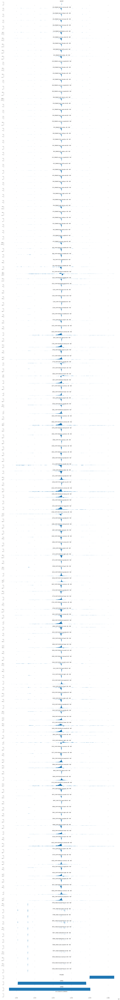

In [28]:
# plot super interesting DNV
from pyensembl import EnsemblRelease
data = EnsemblRelease(107)
chrom = 'chr1'
pos = 223749318
variant = kipoiseq.Variant(chrom, pos, 'C', 'T', id='rs11644125')  # @param
score_cols = enformer_pvals.columns[16:-16]
mask = enformer_pvals[enformer_pvals['var']==f'{chrom}:{pos} C>T']
cols_to_use = mask[score_cols].dropna(axis=1).columns
gene_annotations = pd.read_csv("/pollard/data/projects/sdrusinsky/pollard_lab/data/knownGene.tsv",sep='\t')

# Center the interval at the variant
interval = kipoiseq.Interval(variant.chrom, variant.start, variant.start).resize(SEQUENCE_LENGTH)
seq_extractor = kipoiseq.extractors.VariantSeqExtractor(reference_sequence=fasta_extractor)
center = interval.center() - interval.start

reference = seq_extractor.extract(interval, [], anchor=center)
alternate = seq_extractor.extract(interval, [variant], anchor=center)

# Make predictions for the refernece and alternate allele
reference_prediction = model.predict_on_batch(one_hot_encode(reference)[np.newaxis])['human'][0]
alternate_prediction = model.predict_on_batch(one_hot_encode(alternate)[np.newaxis])['human'][0]


# @title Visualize some tracks
variant_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
variant_track[variant_track.shape[0] // 2] = True
tracks = {'variant': variant_track}
for score_col in cols_to_use:
    score_col_id = int(score_col.split('_')[0])
    tracks[f'{score_col} Alt - Ref'] = alternate_prediction[:, score_col_id] - reference_prediction[:, score_col_id]
chrom_for_nearby_genes = chrom.split('chr')[1]
nearby_genes = data.genes_at_locus(contig = chrom_for_nearby_genes, position = pos - 100000,end = pos + 100000) #use this because if the gene is long, start and end 
new_interval = interval.resize(reference_prediction.shape[0] * 128)
for nearby_gene in nearby_genes:
    if nearby_gene.biotype == 'protein_coding':
        name = nearby_gene.gene_name
        gene_start = nearby_gene.start
        gene_end = nearby_gene.end
        gene_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
        gene_start_bin = max((gene_start - new_interval.start) / 128,0)
        gene_end_bin = (gene_end - new_interval.start)/128
        gene_track[int(gene_start_bin):int(gene_end_bin)+1] = True
        tracks[name] = gene_track



plot_tracks(tracks, interval.resize(reference_prediction.shape[0] * 128), height=1,filename="CAPN2_DNV_Enformer")

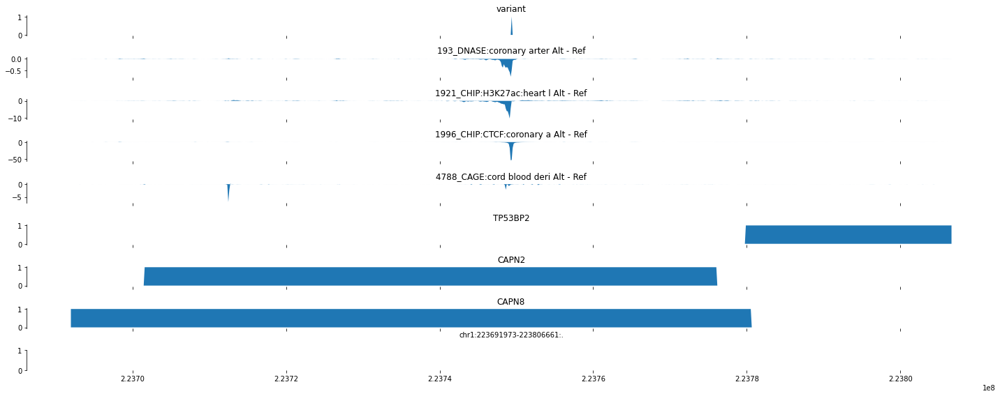

In [41]:
# plot super interesting DNV. Only 4 representative tracks
from pyensembl import EnsemblRelease
data = EnsemblRelease(107)
chrom = 'chr1'
pos = 223749318
variant = kipoiseq.Variant(chrom, pos, 'C', 'T', id='rs11644125')  # @param
score_cols = enformer_pvals.columns[16:-16]
mask = enformer_pvals[enformer_pvals['var']==f'{chrom}:{pos} C>T']
cols_to_use = mask[score_cols].dropna(axis=1).columns

# Center the interval at the variant
interval = kipoiseq.Interval(variant.chrom, variant.start, variant.start).resize(SEQUENCE_LENGTH)
seq_extractor = kipoiseq.extractors.VariantSeqExtractor(reference_sequence=fasta_extractor)
center = interval.center() - interval.start

reference = seq_extractor.extract(interval, [], anchor=center)
alternate = seq_extractor.extract(interval, [variant], anchor=center)

# Make predictions for the refernece and alternate allele
reference_prediction = model.predict_on_batch(one_hot_encode(reference)[np.newaxis])['human'][0]
alternate_prediction = model.predict_on_batch(one_hot_encode(alternate)[np.newaxis])['human'][0]


# @title Visualize some tracks
variant_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
variant_track[variant_track.shape[0] // 2] = True
tracks = {'variant': variant_track}
for score_col in cols_to_use:
    score_col_id = int(score_col.split('_')[0])
    if score_col_id in [193, 4788, 1996,1921]:
        tracks[f'{score_col} Alt - Ref'] = alternate_prediction[:, score_col_id] - reference_prediction[:, score_col_id]
chrom_for_nearby_genes = chrom.split('chr')[1]
nearby_genes = data.genes_at_locus(contig = chrom_for_nearby_genes, position = pos - 100000,end = pos + 100000) #use this because if the gene is long, start and end 
new_interval = interval.resize(reference_prediction.shape[0] * 128)
for nearby_gene in nearby_genes:
    if nearby_gene.biotype == 'protein_coding':
        name = nearby_gene.gene_name
        gene_start = nearby_gene.start
        gene_end = nearby_gene.end
        gene_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
        gene_start_bin = max((gene_start - new_interval.start) / 128,0)
        gene_end_bin = (gene_end - new_interval.start)/128
        gene_track[int(gene_start_bin):int(gene_end_bin)+1] = True
        tracks[name] = gene_track



plot_tracks(tracks, interval.resize(reference_prediction.shape[0] * 128), height=1,filename="CAPN2_DNV_Enformer")

ln MSD: [-5.068651  -5.489077  -6.041117  -5.2463665 -6.384307 ]
ln Max Difference: [-0.8757184 -1.1642821 -1.3973566 -0.9941648 -1.6619323]
512
 
chr1:223749318


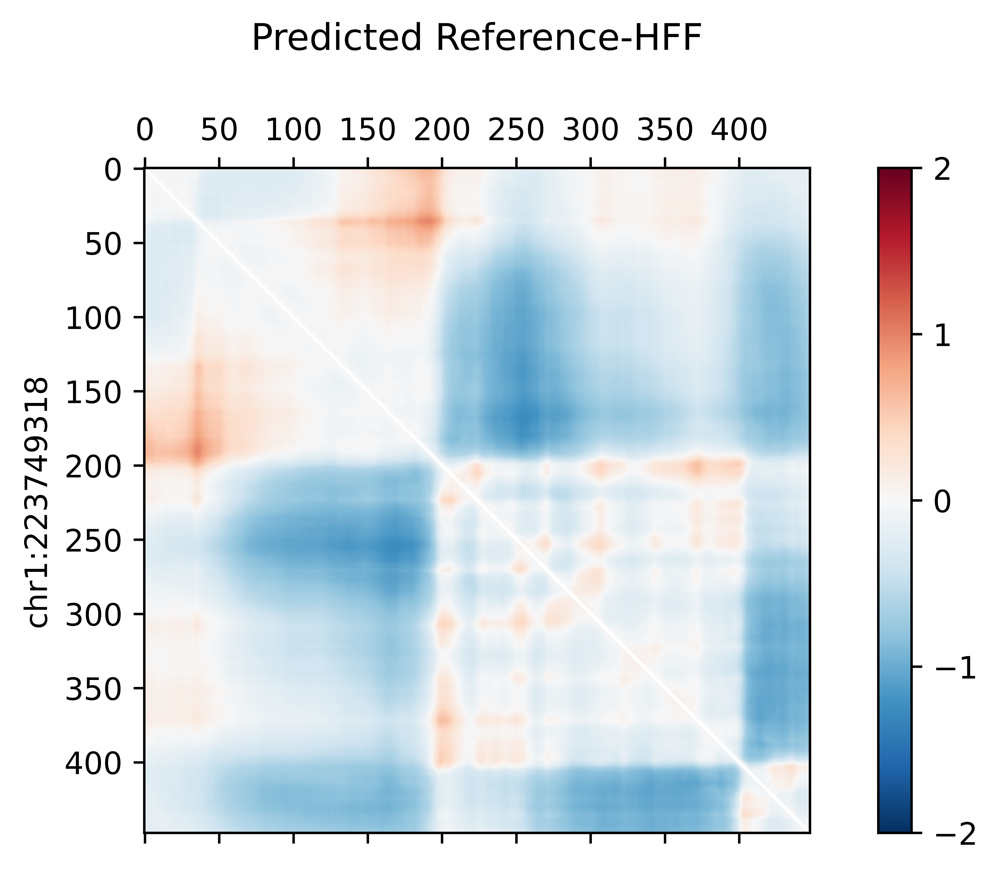

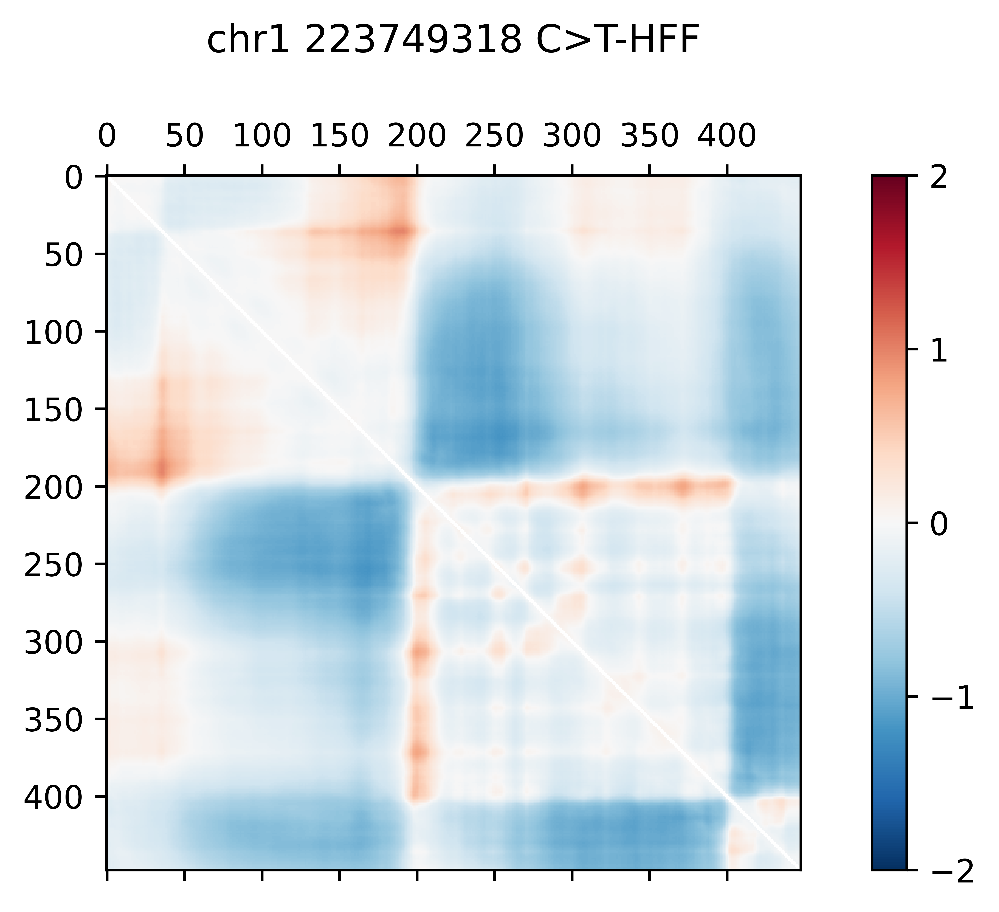

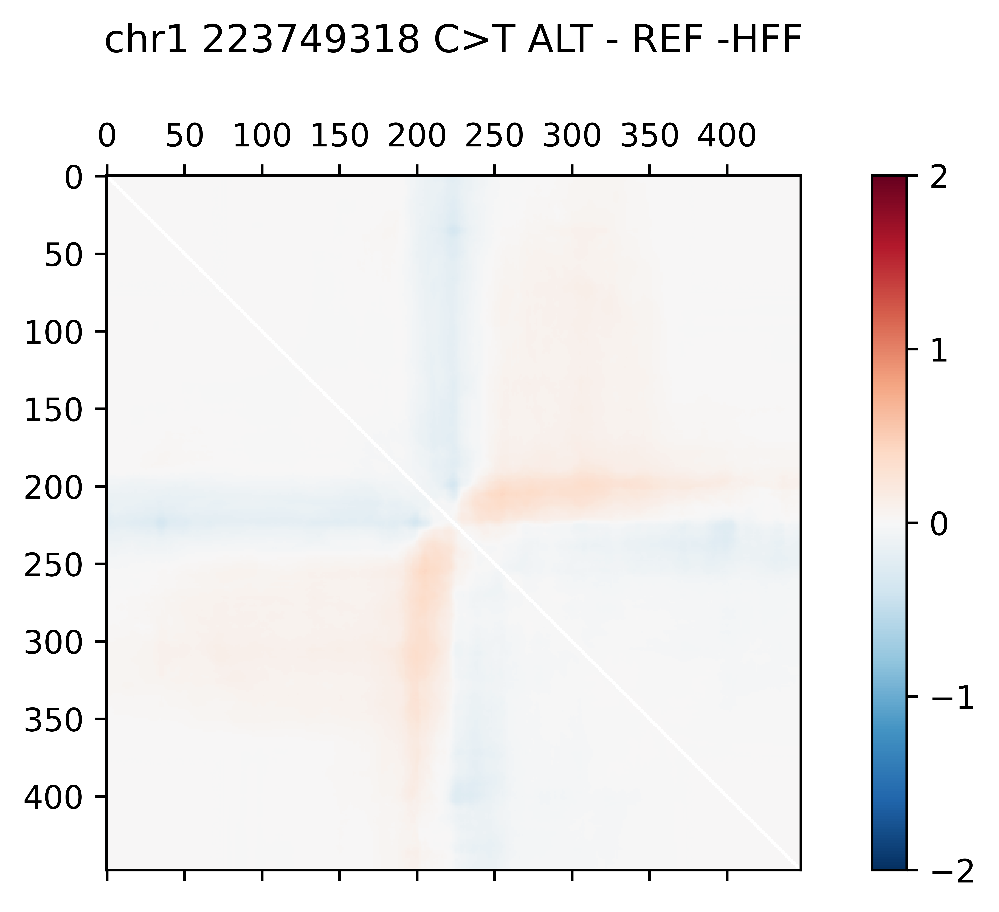

In [42]:
hg38_chr = 'chr1'
hg38_pos = 223749318
hg38_wt = 'C'
hg38_alt = 'T'
plot_variant_effect(hg38_chr,hg38_pos,hg38_wt,hg38_alt)

### Look into another interesting DNV


In [288]:
enformer_eda[enformer_eda['variant_id']=='chr21:42955811 ACACCGCTGCGT>A']

,num_sig_Accessibility_tracks,num_sig_CAGE_tracks,num_sig_ChIP_tracks,enformer_scoring_system,chrom,pos,ref,alt,variant_id
4787,59,82,127,max,chr21,42955811,ACACCGCTGCGT,A,chr21:42955811 ACACCGCTGCGT>A
3634,57,83,67,summed,chr21,42955811,ACACCGCTGCGT,A,chr21:42955811 ACACCGCTGCGT>A


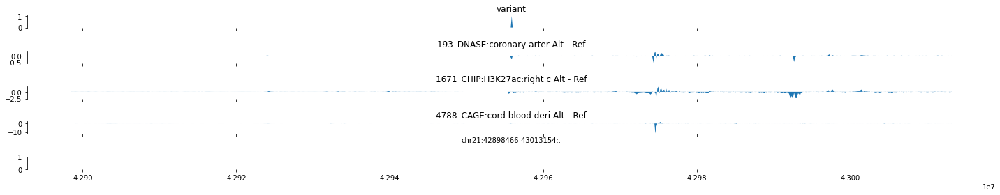

In [43]:
chrom = 'chr21'
pos = 42955811
variant = kipoiseq.Variant(chrom, pos, 'ACACCGCTGCGT', 'A', id='rs11644125')  # @param
score_cols = enformer_pvals.columns[16:-16]
mask = enformer_pvals[enformer_pvals['var']==f'{chrom}:{pos} ACACCGCTGCGT>A']
cols_to_use = mask[score_cols].dropna(axis=1).columns

# Center the interval at the variant
interval = kipoiseq.Interval(variant.chrom, variant.start, variant.start).resize(SEQUENCE_LENGTH)
seq_extractor = kipoiseq.extractors.VariantSeqExtractor(reference_sequence=fasta_extractor)
center = interval.center() - interval.start

reference = seq_extractor.extract(interval, [], anchor=center)
alternate = seq_extractor.extract(interval, [variant], anchor=center)

# Make predictions for the refernece and alternate allele
reference_prediction = model.predict_on_batch(one_hot_encode(reference)[np.newaxis])['human'][0]
alternate_prediction = model.predict_on_batch(one_hot_encode(alternate)[np.newaxis])['human'][0]


# @title Visualize some tracks
variant_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
variant_track[variant_track.shape[0] // 2] = True
tracks = {'variant': variant_track}
for score_col in cols_to_use:
    score_col_id = int(score_col.split('_')[0])
    if score_col_id in [193, 4788, 1671]:
        tracks[f'{score_col} Alt - Ref'] = alternate_prediction[:, score_col_id] - reference_prediction[:, score_col_id]
    



plot_tracks(tracks, interval.resize(reference_prediction.shape[0] * 128), height=1,filename = "PKNOX1_DNV_Enformer")

ln MSD: [-5.721168  -6.153338  -6.6388083 -5.861975  -6.9421062]
ln Max Difference: [-1.201719  -1.4189944 -1.7725817 -1.3916867 -1.9369103]
512
 
chr21:42955811


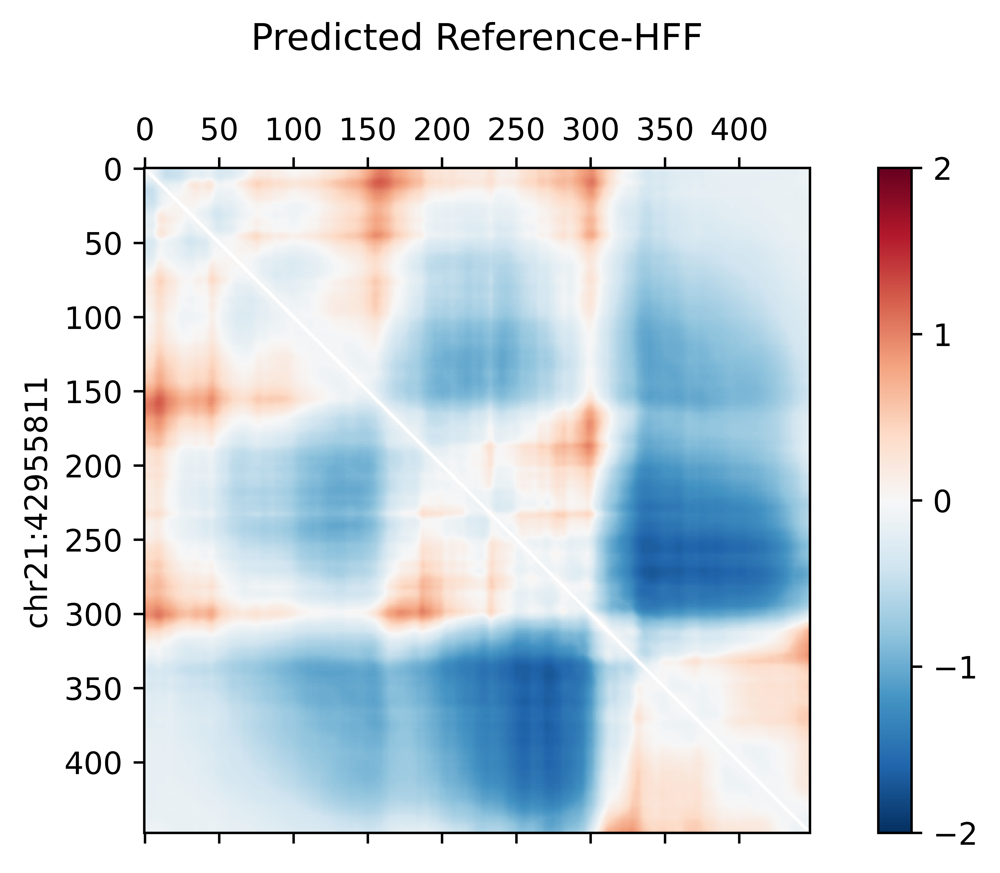

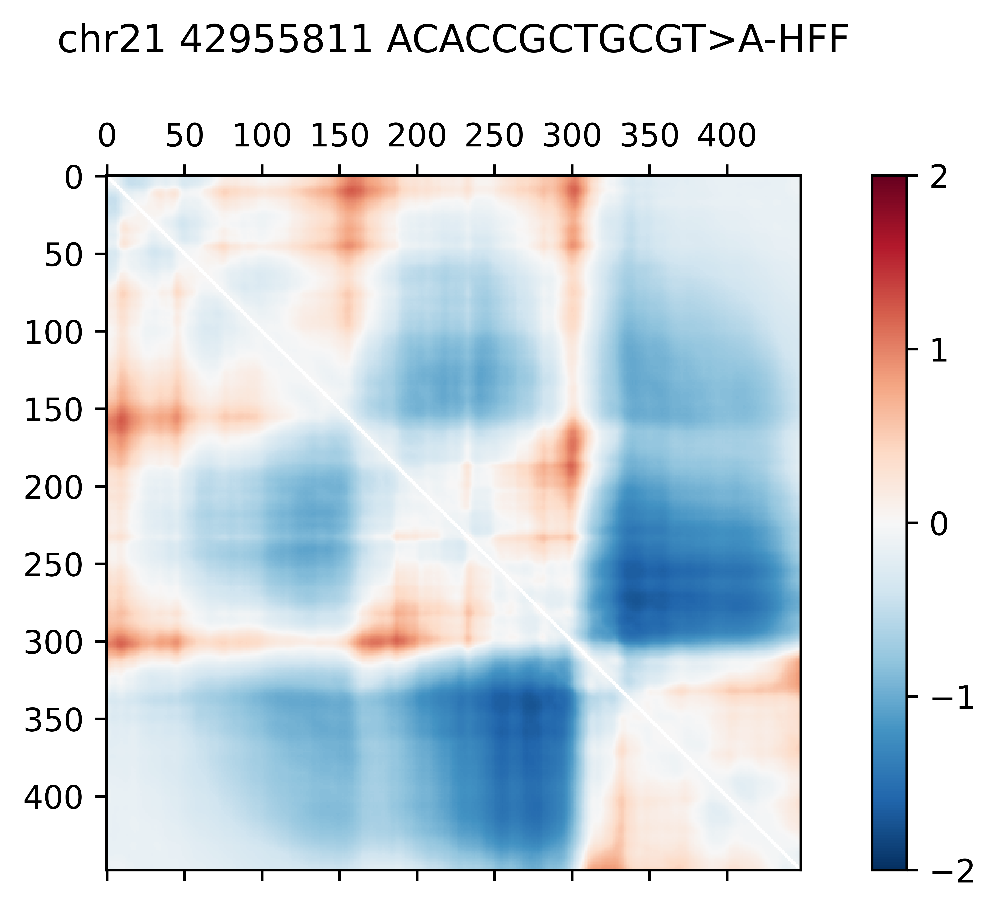

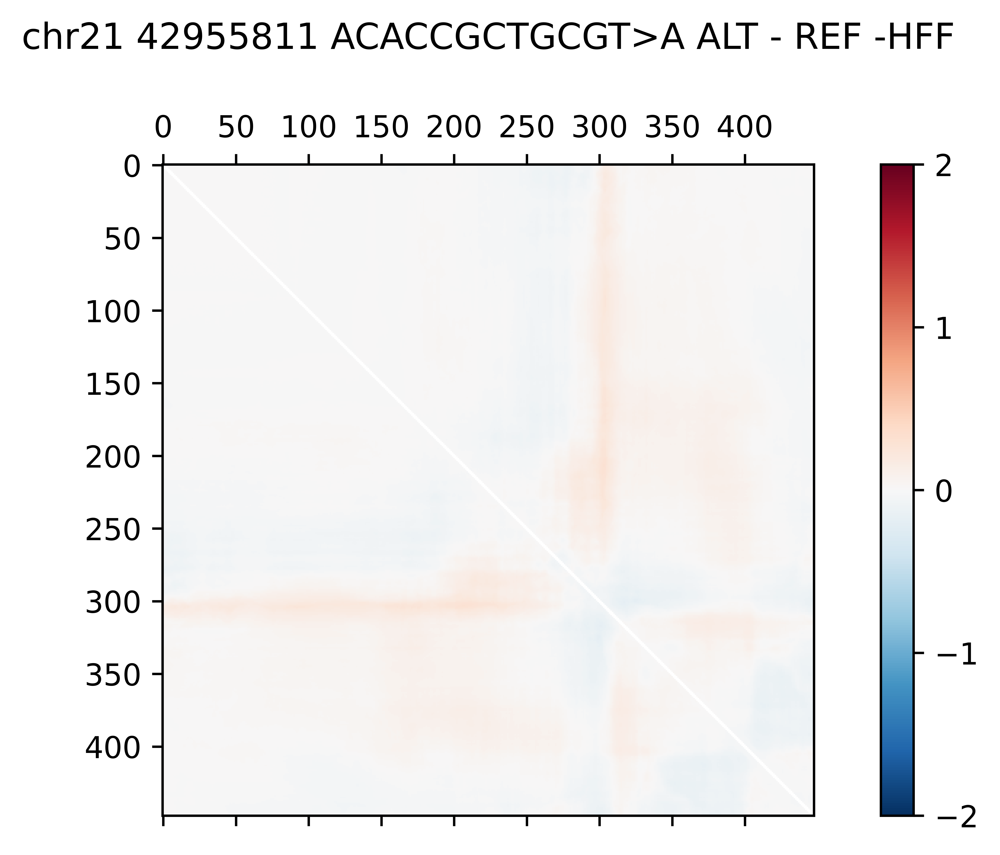

In [44]:
hg38_chr = 'chr21'
hg38_pos = 42955811
hg38_wt = 'ACACCGCTGCGT'
hg38_alt = 'A'
plot_variant_effect(hg38_chr,hg38_pos,hg38_wt,hg38_alt)

### Look into another interesting DNV


In [45]:
enformer_eda[enformer_eda['variant_id']=='chr13:106533268 TCGCC>T']

,num_sig_Accessibility_tracks,num_sig_CAGE_tracks,num_sig_ChIP_tracks,enformer_scoring_system,chrom,pos,ref,alt,variant_id
2234,41,80,94,max,chr13,106533268,TCGCC,T,chr13:106533268 TCGCC>T
1659,25,64,85,summed,chr13,106533268,TCGCC,T,chr13:106533268 TCGCC>T


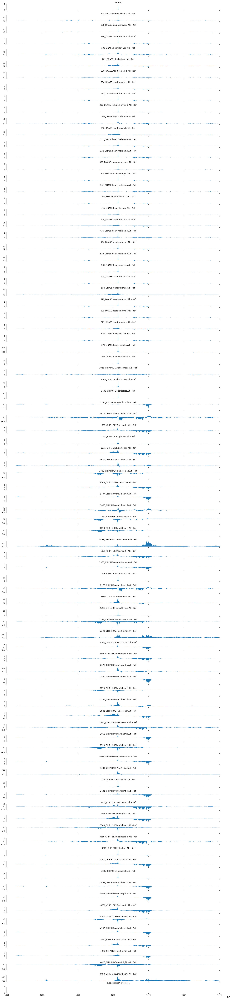

In [46]:
# plotting another interesting DNV

# plot super interesting DNV
chrom = 'chr22'
pos = 42702882
variant = kipoiseq.Variant(chrom, pos, 'C', 'T', id='rs11644125')  # @param
score_cols = enformer_pvals.columns[16:-16]
mask = enformer_pvals[enformer_pvals['var']==f'{chrom}:{pos} C>T']
cols_to_use = mask[score_cols].dropna(axis=1).columns

# Center the interval at the variant
interval = kipoiseq.Interval(variant.chrom, variant.start, variant.start).resize(SEQUENCE_LENGTH)
seq_extractor = kipoiseq.extractors.VariantSeqExtractor(reference_sequence=fasta_extractor)
center = interval.center() - interval.start

reference = seq_extractor.extract(interval, [], anchor=center)
alternate = seq_extractor.extract(interval, [variant], anchor=center)

# Make predictions for the refernece and alternate allele
reference_prediction = model.predict_on_batch(one_hot_encode(reference)[np.newaxis])['human'][0]
alternate_prediction = model.predict_on_batch(one_hot_encode(alternate)[np.newaxis])['human'][0]


# @title Visualize some tracks
variant_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
variant_track[variant_track.shape[0] // 2] = True
tracks = {'variant': variant_track}
for score_col in cols_to_use:
    score_col_id = int(score_col.split('_')[0])
    tracks[f'{score_col} Alt - Ref'] = alternate_prediction[:, score_col_id] - reference_prediction[:, score_col_id]


plot_tracks(tracks, interval.resize(reference_prediction.shape[0] * 128), height=1)

ln MSD: [-7.228964  -7.7017393 -8.188536  -7.3921757 -8.535121 ]
ln Max Difference: [-2.0419211 -2.3254006 -2.6894374 -2.2643244 -2.8630712]
512
 
chr22:42702882


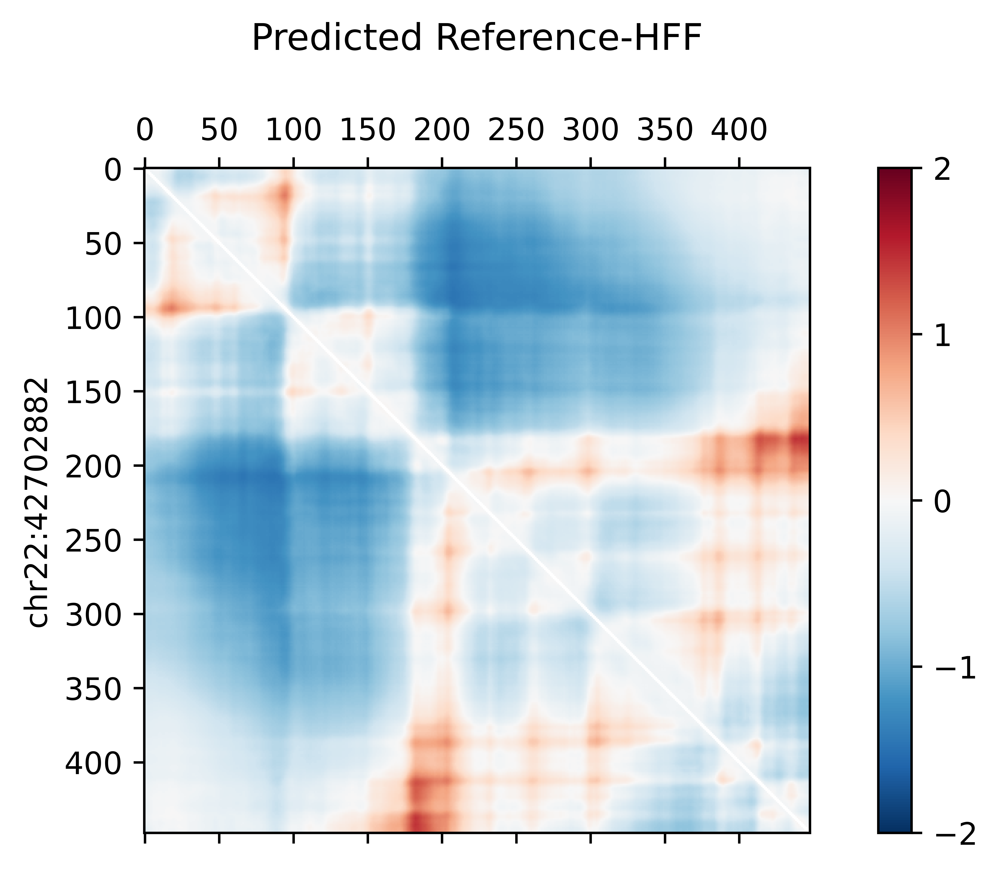

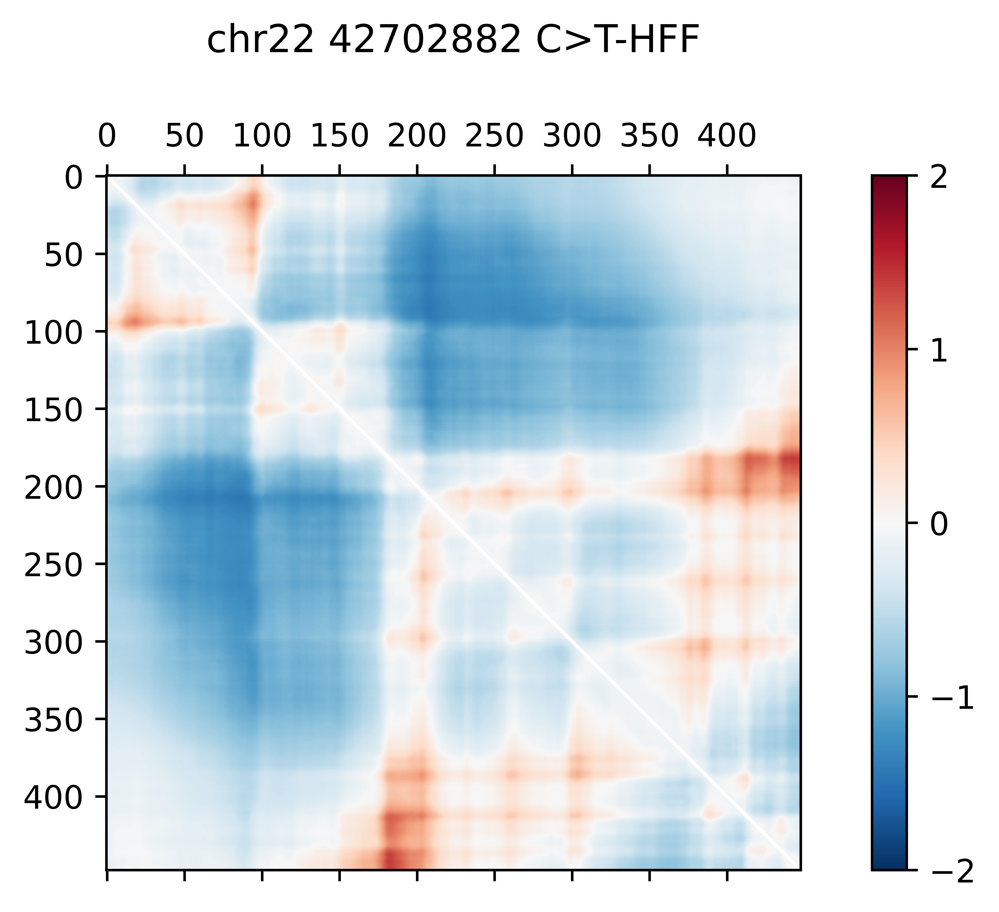

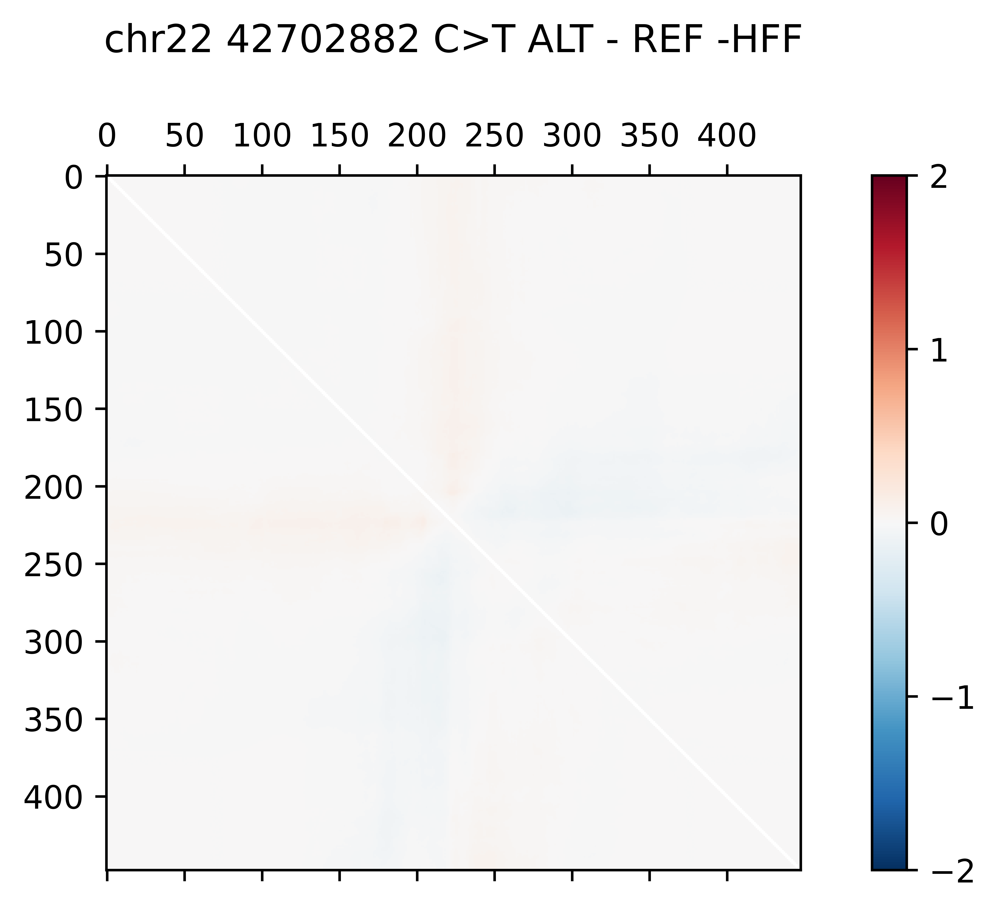

In [48]:
hg38_chr = 'chr22'
hg38_pos = 42702882
hg38_wt = 'C'
hg38_alt = 'T'
plot_variant_effect(hg38_chr,hg38_pos,hg38_wt,hg38_alt)

### Look into another interesting DNV


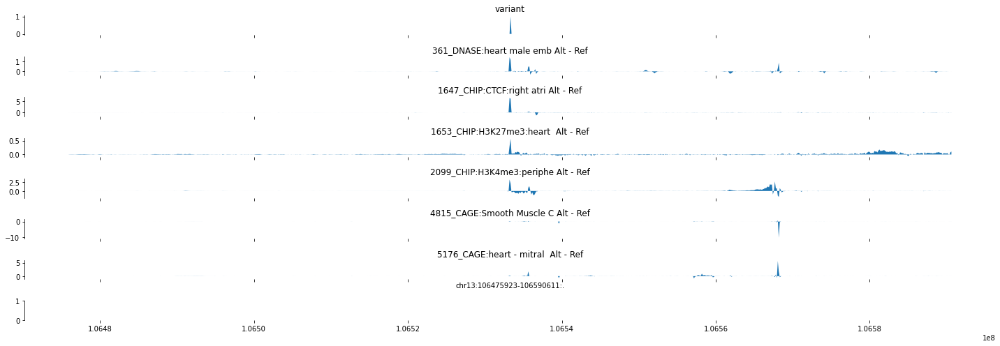

In [52]:
# plotting another interesting DNV
# chr13:106533268 TCGCC>T
chrom = 'chr13'
pos = 106533268
variant = kipoiseq.Variant(chrom, pos, 'TCGCC', 'T', id='rs11644125')  # @param
score_cols = enformer_pvals.columns[16:-16]
mask = enformer_pvals[enformer_pvals['var']==f'{chrom}:{pos} TCGCC>T']
cols_to_use = mask[score_cols].dropna(axis=1).columns

# Center the interval at the variant
interval = kipoiseq.Interval(variant.chrom, variant.start, variant.start).resize(SEQUENCE_LENGTH)
seq_extractor = kipoiseq.extractors.VariantSeqExtractor(reference_sequence=fasta_extractor)
center = interval.center() - interval.start

reference = seq_extractor.extract(interval, [], anchor=center)
alternate = seq_extractor.extract(interval, [variant], anchor=center)

# Make predictions for the refernece and alternate allele
reference_prediction = model.predict_on_batch(one_hot_encode(reference)[np.newaxis])['human'][0]
alternate_prediction = model.predict_on_batch(one_hot_encode(alternate)[np.newaxis])['human'][0]


# @title Visualize some tracks
variant_track = np.zeros_like(reference_prediction[:, 0], dtype=bool)
variant_track[variant_track.shape[0] // 2] = True
tracks = {'variant': variant_track}
for score_col in cols_to_use:
    score_col_id = int(score_col.split('_')[0])
    if score_col_id in [361,1647,2099,1653, 4815,5176]:
        tracks[f'{score_col} Alt - Ref'] = alternate_prediction[:, score_col_id] - reference_prediction[:, score_col_id]




plot_tracks(tracks, interval.resize(reference_prediction.shape[0] * 128), height=1,filename = "ARGLU1_DNV_Enformer")

ln MSD: [-6.7650013 -6.862256  -7.632153  -6.8837743 -8.038977 ]
ln Max Difference: [-1.850702  -2.0452225 -2.3928912 -2.0096805 -2.6880875]
512
 
chr13:106533268


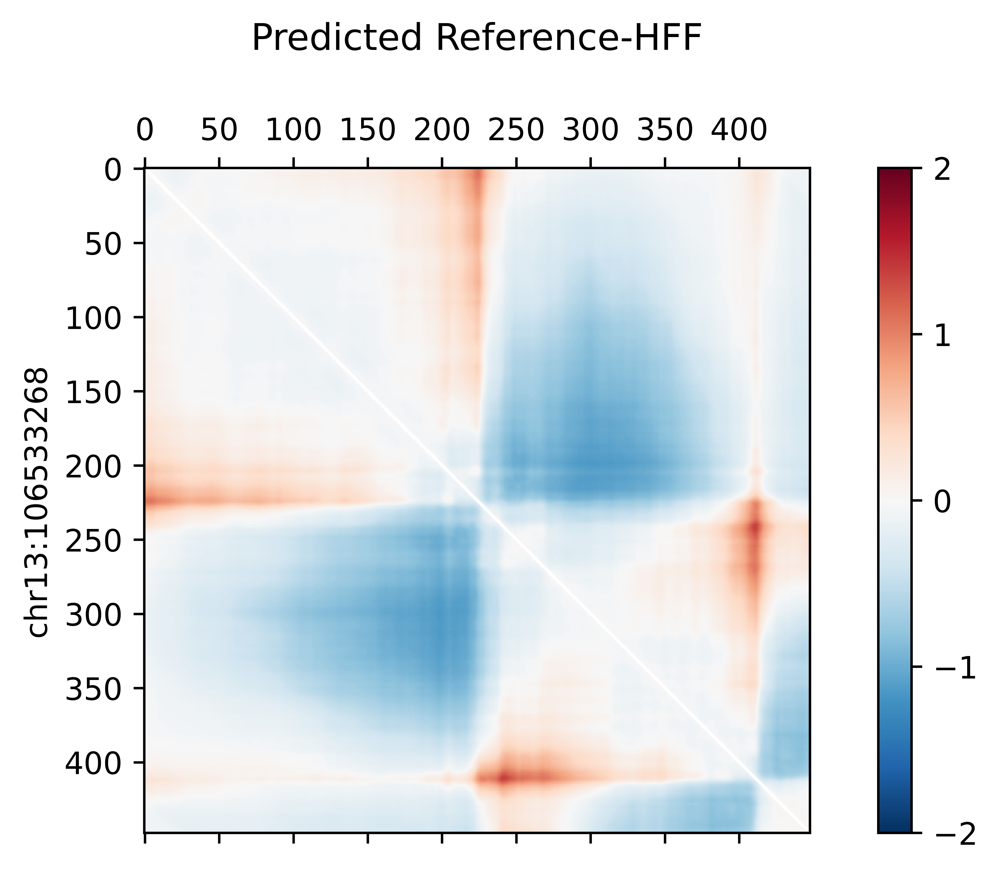

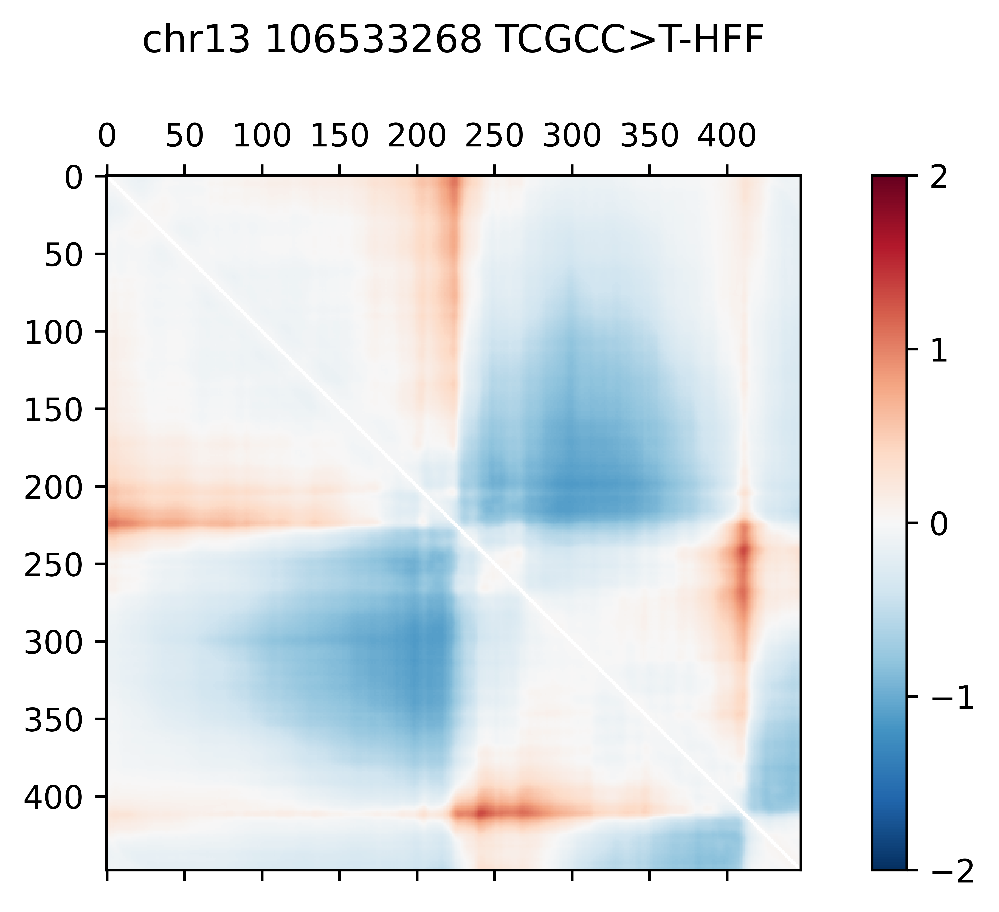

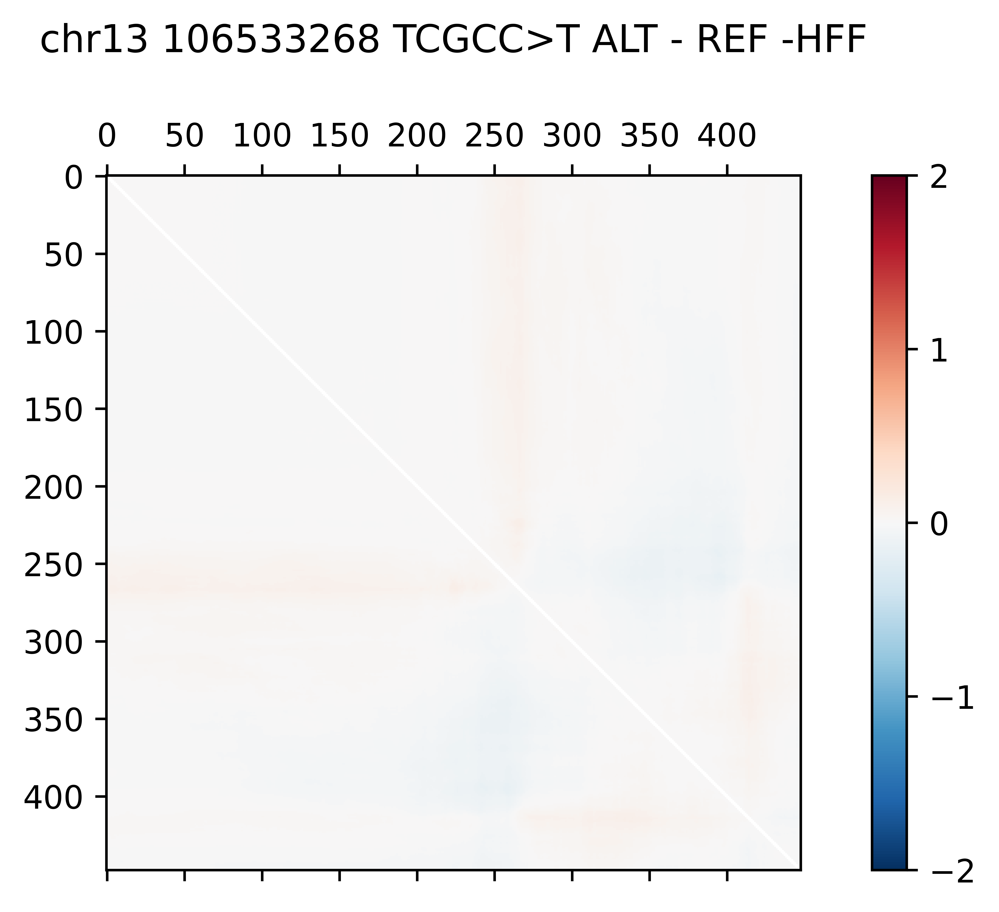

In [50]:
hg38_chr = 'chr13'
hg38_pos = 106533268
hg38_wt = 'TCGCC'
hg38_alt = 'T'
plot_variant_effect(hg38_chr,hg38_pos,hg38_wt,hg38_alt)